# Smooth electron hole

In [98]:
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib
import scipy.optimize as op
import plasmapy
from scipy import special as sp
from scipy import integrate
from tqdm import tqdm
from scipy.misc import derivative
import numba as nb
import math
import matplotlib.cm as cm
from prettytable import PrettyTable
from scipy.optimize import curve_fit
%config InlineBackend.figure_format = 'svg'

In [99]:
plt.rcParams.update({'font.size': 16})
plt.rcParams.update({'lines.linewidth': 2})

In [281]:
Te = 1
mi = 100
# k = 0.1
# L = 2*np.pi/k
L = 100
cs = np.sqrt(mi/Te)
u = 1.1

vmax = 5 # 速度最大值
nx = 1000
nv = 500
dx = L/(nx-1)
dv = 2*vmax/(nv-1)
x = np.linspace(0, L, num=nx, endpoint=True)
v = np.linspace(-vmax, vmax, num=nv, endpoint=True)
V,X=np.meshgrid(v,x)

c1 = 0
c2 = 0

dt = 0.02
max_steps  = 10000
data_steps = max_steps
data_num = int(max_steps/data_steps)+1

path = 'E:/代码/vlasov-es1d/data/'

## IASW Poisson Equation
$$ \phi''=e^\phi - \frac{M}{\sqrt{M^2-2\phi}} $$
- if $\phi<<1$ and $M\approx 1$
$$\phi = 3\delta M \mathrm{sech}^2 \left[ \sqrt{\frac{\delta M}{2}}(x-\frac{L}{2}) \right]$$
with $\delta M = M -1$

In [282]:
def poisson_eq(x,phi):
    return np.vstack((phi[1], np.exp(phi[0])-u/np.sqrt(u**2-2*phi[0])))
def bc(ya,yb):
    return np.array([ya[0],yb[0]])

In [285]:
phi_sim = np.loadtxt(os.path.join(path,"phi_sc"))

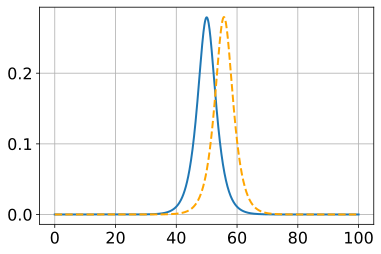

phi_dev_guess(x=0)= 1.043701735567726e-10


In [286]:
xp = np.sqrt(0.5*(u-1)) * (x-L/2)
phi_guess = 3*(u-1)*np.cosh(xp)**(-2)
phi_dev_guess = -6*(u-1)*np.sqrt(0.5*(u-1))*np.cosh(xp)**(-2)*np.tanh(xp)
phi_sc = integrate.solve_bvp(poisson_eq,bc,x,[phi_guess,phi_dev_guess])
plt.plot(x,phi_sc.sol(x)[0])
plt.plot(x,phi_sim,'--',color='orange')
plt.grid()
plt.show()
print("phi_dev_guess(x=0)=",phi_dev_guess[0])

In [287]:
xc = L/2
def phi2_theo(x,a,da):
    xp = (x-xc)/da
    return a*np.cosh(xp)**(-2)
para2,pcov=curve_fit(phi2_theo,x,phi_sc.sol(x)[0])
print(para2)

[0.27339986 4.10749563]


In [273]:
progesses = np.arange(0,data_num,1)

fe = []
fi = []
phi = []

for progess in progesses:
    fe_temp = np.loadtxt(os.path.join(path,"fe"+str(progess)))
    fe.append(fe_temp)
    fi_temp = np.loadtxt(os.path.join(path,"fi"+str(progess)))
    fi.append(fi_temp)
    phi_temp = np.loadtxt(os.path.join(path,"phi"+str(progess)))
    phi.append(phi_temp)

In [274]:
fig = plt.figure(figsize=(12, 8))
fig.set_tight_layout(True)

test_frame = 1
x_ticks=np.linspace(0,L,num=6)
ne0 = np.sum(fe[0],axis=1)*dv
ne = np.sum(fe[test_frame],axis=1)*dv
ni0 = np.sum(fi[0],axis=1)*dv
ni = np.sum(fi[test_frame],axis=1)*dv
lvse = np.linspace(0,fe[0].max(),num=15)

ax1 = plt.subplot(221)
ax1cm = ax1.contourf(X, V, fe[test_frame], levels=lvse,cmap=cm.plasma)
plt.xticks(x_ticks,[])
ax1.set_ylabel(r'$v$')
ax1.set_xlim(0,L)
ax1.set_ylim(-2.5,2.5)

testx = int(nx/2)
ax2 = plt.subplot(222)
ax2cm = ax2.contourf(X, V, fi[test_frame], levels=15,cmap=cm.plasma)
plt.xticks(x_ticks,[])
ax2.set_ylabel(r'$v$')
ax2.set_xlim(0,L)
ax2.set_ylim(-2,2)

ax3 = plt.subplot(223)
ax3.plot(x, ne, color='red',label='$n_e$')
ax3.plot(x, ni, color='blue',label='$n_i$')
ax3.set_ylabel(r'$n$')
ax3.set_xlim(0,L)
plt.xticks(x_ticks)
ax3.legend()
ax3.grid()

ax4 = plt.subplot(224)
ax4.plot(x, phi[test_frame], color='red')
ax4.plot(x, phi[0],'--', color='blue')
ax4.set_xlabel(r'$x$')
ax4.set_ylabel(r'$\phi$')
ax4.set_xlim(0,L)
# ax4.set_ylim(-0.05,0.32)
plt.xticks(x_ticks)
ax4.grid()

# plt.tight_layout()
plt.show()